# <center> Best Neighborhood for A New Vegan Restaurant </center>

# Introduction
With rising concerns on the health and environmental impacts of meat-based diets, many individuals are choosing to opt for plant-based nutrition. However, the traditional restaurant industry has yet to catch up with the growing demand of vegan options. This disparity between demand and supply presents the perfect opportunity and market entry point for a vegan restaurant. 

One of the most important aspect of opening a new restaurant is choosing its location. This is exactly the goal of this data analysis - **choosing the best neighborhood in New York City for a vegan joint**.

# Data
For this analysis, the primary source of data will be Foursquare. First, we will explore if there are neighborhoods that are already hubs for vegan restaurants. Next, based on those results, we will try to identify if there are trends in the neighborhoods where vegan restaurants are clustered. Finally we will find if there are other neighborhoods with similar trends where the number of vegan restaurants are currently lower, which will present a potential for a new vegan place.

## Import all Necessary Libraries

In [44]:
import pandas as pd
import numpy as np
from pandas import DataFrame
from project_lib import Project

import json # library to handle JSON files

!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install folium
import folium # map rendering library

!pip install turfpy
from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

print('Libraries imported.')

Libraries imported.


## Webscraping Names of NYC Neighborhoods and Cleaning Dataframe
This information is publicly available in GeoJSON format by NYC Department of City Planning.

In [45]:
url = 'https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/ArcGIS/rest/services/NYC_Neighborhood_Tabulation_Areas/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson'
url_data = requests.get(url)
url_data_json = url_data.json()
hood_df = pd.json_normalize(url_data_json, 'features')
hood_df.head()

,type,id,geometry.type,geometry.coordinates,properties.OBJECTID,properties.BoroCode,properties.BoroName,properties.CountyFIPS,properties.NTACode,properties.NTAName,properties.Shape__Area,properties.Shape__Length
0,Feature,1,Polygon,"[[[-73.9760507905698, 40.6312841471042], [-73....",1,3,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.227831
1,Feature,2,Polygon,"[[[-73.8037916164017, 40.7756183875692], [-73....",2,4,Queens,081,QN51,Murray Hill,5.248828e+07,33266.904872
2,Feature,3,Polygon,"[[[-73.8610986495631, 40.7636727481715], [-73....",3,4,Queens,081,QN27,East Elmhurst,1.972695e+07,19816.684690
3,Feature,4,Polygon,"[[[-73.7572580842358, 40.7181468677945], [-73....",4,4,Queens,081,QN07,Hollis,2.288777e+07,20976.335600
4,Feature,5,Polygon,"[[[-73.9585942121111, 40.6104112689022], [-73....",5,3,Brooklyn,047,BK25,Homecrest,2.999197e+07,27514.022918


Now that the data has been successfully scraped from the website and put into a dataframe, it needs to be cleaned to simplify further operations and analysis. For example, several columns (such as 'type', 'id', 'geometry type', etc... are not needed) and for the remaining columns, the names should be editted.

In [46]:
## Delete unnecessary columns
hood_df.drop(columns=['type','id', 'geometry.type','properties.OBJECTID', 'properties.BoroCode',
              'properties.CountyFIPS', 'properties.NTACode', 'properties.Shape__Area', 'properties.Shape__Length'], axis=1, inplace=True)

## Rename columns
hood_df.columns = ['Geometry', 'Borough', 'Neighborhood']

hood_df.head()

,Geometry,Borough,Neighborhood
0,"[[[-73.9760507905698, 40.6312841471042], [-73....",Brooklyn,Borough Park
1,"[[[-73.8037916164017, 40.7756183875692], [-73....",Queens,Murray Hill
2,"[[[-73.8610986495631, 40.7636727481715], [-73....",Queens,East Elmhurst
3,"[[[-73.7572580842358, 40.7181468677945], [-73....",Queens,Hollis
4,"[[[-73.9585942121111, 40.6104112689022], [-73....",Brooklyn,Homecrest


In order to use get Foursquares data for these neighborhoods, we must first get the latitude and longitude of these neighborhoods. To do so, we will use the geolocator library. To avoid repetiton and for loops, we can create a function that takes in the neighborhood and returns the latitude and longitude

In [47]:
# Create function to get latitude and longitude
def get_lat_lon(hood):
    geolocator = Nominatim(user_agent="my_user_agent")
    city ="NYC"
    country ="USA"
    try:
        loc = geolocator.geocode(hood+','+city+','+ country)
        lat = loc.latitude
        lon = loc.longitude
    except:
        lat = np.NAN
        lon = np.NAN
    return pd.Series([lat,lon])

In [48]:
# Create new columns to store latitude and longitude
hood_df[['Latitude', 'Longitude']] = hood_df['Neighborhood'].apply(get_lat_lon)

In [49]:
# Check how many of the neighborhoods do not have latitude and longitude
hood_df.isna().sum()

Geometry         0
Borough          0
Neighborhood     0
Latitude        69
Longitude       69
dtype: int64

There are 69 of the neighborhoods for which we could not find the latitude and longitude. Therefore, we decide to just disregard these specific neighborhoods.

In [50]:
hood_df.dropna(axis=0, inplace=True)

# Before moving forward, we keep a copy of this cleaned dataframe, hood_df_copy
hood_df_copy = hood_df.copy()
hood_df.head()

,Geometry,Borough,Neighborhood,Latitude,Longitude
0,"[[[-73.9760507905698, 40.6312841471042], [-73....",Brooklyn,Borough Park,40.633993,-73.996806
1,"[[[-73.8037916164017, 40.7756183875692], [-73....",Queens,Murray Hill,40.748157,-73.978750
2,"[[[-73.8610986495631, 40.7636727481715], [-73....",Queens,East Elmhurst,40.761212,-73.865136
3,"[[[-73.7572580842358, 40.7181468677945], [-73....",Queens,Hollis,40.713436,-73.767077
4,"[[[-73.9585942121111, 40.6104112689022], [-73....",Brooklyn,Homecrest,40.586113,-73.957310


We finally have all we need to visualize the distribution of our neighborhoods around NYC. For this, we use the Folium library.

In [51]:
# First we create a map of NYC using folium
nyc_lat_lon = [40.7128, -74.0060]
map_nyc = folium.Map(location=nyc_lat_lon, zoom_start=11)

# add Boroughs to the map
for lat, lon, boro, hood in zip(hood_df['Latitude'], hood_df['Longitude'], hood_df['Borough'], hood_df['Neighborhood']):
    label = '{}:{}'.format(boro,hood)
    folium.CircleMarker([lat,lon],
                        radius=5,
                        popup=label,
                        color='red',
                        fill=True,
                        fill_color='red',
                        fill_opacity=0.7,
                        parse_html=False).add_to(map_nyc)

map_nyc

## Define my Foursquare Credentials

In [52]:
CLIENT_ID = 'T5V0I1ANOTP2LLASIJL5EY0RTEAWWFFKGC4PECNZM5VUETB2' # your Foursquare ID
CLIENT_SECRET = '5WXDDYM1WLSOAOSGSTQSFQ1NENKKMV14IY4TYZAEIJDGWQYE' # your Foursquare Secret
VERSION = '20210201' # Foursquare API version - yesterday's date: 01 February 2021

print('My credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

My credentails:
CLIENT_ID: T5V0I1ANOTP2LLASIJL5EY0RTEAWWFFKGC4PECNZM5VUETB2
CLIENT_SECRET:5WXDDYM1WLSOAOSGSTQSFQ1NENKKMV14IY4TYZAEIJDGWQYE


## Checking the Top 100 Venues in 1 Km Radius of Each Neighborhood

To avoid looping, we create a function that performs that API call to Foursquare to get the venues for each neighborhood.

In [55]:
def GetVenueInfo(hood_name, hood_lat, hood_lon):

    LIMIT = 100 # limit of number of venues returned by Foursquare API
    radius = 1000 # define radius
    
    venues_list=[]
    for name, lat, lon in zip(hood_name, hood_lat, hood_lon):
        print(name)
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lon, 
            radius, 
            LIMIT)
        
        results = requests.get(url).json()["response"]['groups'][0]['items']
        

        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lon, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    venue_results = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    venue_results.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']


    print('Done getting all venues in downtown neighborhoods')
    return(venue_results, venues_list)

Now the above function can be called to get venues in each neighborhood.

In [56]:
venues, venue_list = GetVenueInfo(hood_df['Neighborhood'], hood_df['Latitude'], hood_df['Longitude'])

Borough Park
Murray Hill
East Elmhurst
Hollis
Homecrest
Fresh Meadows-Utopia
St. Albans
Madison
Erasmus
Longwood
Clinton Hill
Cambria Heights
Midwood
Gravesend
Bensonhurst East
Williamsburg
Bedford
Stuyvesant Heights
Ocean Hill
Crown Heights South
Starrett City
Bushwick South
Bushwick North
Ridgewood
Ocean Parkway South
Fort Greene
West Farms-Bronx River
Parkchester
Glendale
Clinton
Queens Village
Middle Village
Bronxdale
South Ozone Park
Bath Beach
Bensonhurst West
Maspeth
College Point
Rikers Island
Arden Heights
Brownsville
Lincoln Square
Midtown-Midtown South
Highbridge
Windsor Terrace
Canarsie
Flatbush
Flatlands
Rossville-Woodrow
Yorkville
Auburndale
East Flushing
Morrisania-Melrose
West Village
Upper West Side
Norwood
Fordham South
Mount Hope
Co-op City
East Tremont
Rosedale
East Williamsburg
Pelham Parkway
Bayside-Bayside Hills
Hamilton Heights
East Harlem South
Old Astoria
Steinway
Central Harlem South
East Harlem North
Flushing
Springfield Gardens North
Sunset Park East
Oaklan

Let's have a first look at the number of restaurants with "Vegan" listed in their category designation.

In [57]:
vegan_venues = venues.loc[venues['Venue Category'].str.contains('Vegan')].reset_index(drop=True)
vegan_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Borough Park,40.633993,-73.996806,Lucky Vegetarian,40.640332,-74.004158,Vegetarian / Vegan Restaurant
1,Murray Hill,40.748157,-73.978750,Franchia,40.747549,-73.981124,Vegetarian / Vegan Restaurant
2,Erasmus,40.649548,-73.955971,Zen Vegetarian House,40.653919,-73.959496,Vegetarian / Vegan Restaurant
3,Clinton Hill,40.689722,-73.965278,LuAnne's Wild Ginger,40.689644,-73.969824,Vegetarian / Vegan Restaurant
4,Gravesend,40.596134,-73.973943,The Juice Theory,40.604142,-73.970543,Vegetarian / Vegan Restaurant


In order to see whether these vegan places lie in areas of concentration of restaurants, we can visualize them along with all other restaurants on the same map of NYC.

The vegan restaurants are plotted as **orange circle markers** while all other restaurants are plotted as **small blue markers**.

In [58]:
restaurants = venues.loc[venues['Venue Category'].str.contains('Restaurant')].reset_index(drop=True)

In [59]:
# First we create a map of NYC using folium
nyc_lat_lon = [40.7128, -74.0060]
map_nyc = folium.Map(location=nyc_lat_lon, zoom_start=11)

    
# add Vegan restaurants to the map
for lat, lon, name in zip(vegan_venues['Venue Latitude'], vegan_venues['Venue Longitude'], vegan_venues['Venue']):
    label = name
    folium.CircleMarker([lat,lon],
                        radius=10,
                        popup=label,
                        color='#FFA500',
                        fill=True,
                        fill_color='#C35817',
                        fill_opacity=0.3,
                        parse_html=False).add_to(map_nyc)
    

# add all restaurants to the map
for lat, lon, name in zip(restaurants['Venue Latitude'], restaurants['Venue Longitude'], restaurants['Venue']):
    label = name
    folium.CircleMarker([lat,lon],
                        radius=0.05,
                        popup=label,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.7,
                        parse_html=False).add_to(map_nyc)    
    
map_nyc

To further the analysis of where our new vegan restaurant should be opened, we must first understand our target market.

## Understanding the democraphic of Vegans:

With data collected by Gallup and processed by Statista, we can have a quick look at the age and socio-economic groups who choose to adhere to a vegan/vegeterian diet:

<a href="https://www.statista.com/chart/14989/who-are-americas-vegans-and-vegetarians/" title="Infographic: Who Are America's Vegans & Vegetarians? | Statista"><img src="https://cdn.statcdn.com/Infographic/images/normal/14989.jpeg" alt="Infographic: Who Are America's Vegans & Vegetarians? | Statista" width="100%" height="auto" style="width: 100%; height: auto !important; max-width:960px;-ms-interpolation-mode: bicubic;"/></a> You will find more infographics at <a href="https://www.statista.com/chartoftheday/">Statista</a>

From the chart above, we see that **the target market for vegan and vegetarians should be 18-49 year olds. This age group roughly represents millenials**. We can check the NYC demographics to understand which locations in NYC hold the most millenials. Consider this table with data from the U.S. Census Bureau (source: https://propertyclub.nyc/article/brooklyn-make-way-manhattan-s-financial-district-is-nyc-s-millennial-hotbed):
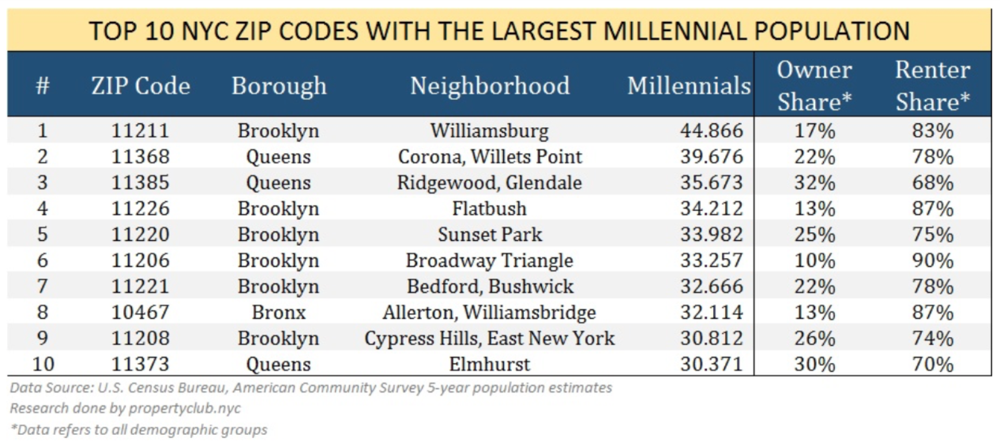

It is evident that **Brooklyn is the borough with the most millenials!**

Checking our NYC map again, but this time focusing only on Brooklyn, we have the following picture:

In [68]:
from folium.features import DivIcon

# First we create a map of NYC using folium
bkl_lat_lon = [40.6482, -73.9442]
map_bkl = folium.Map(location=bkl_lat_lon, zoom_start=11.5)

    
# add Vegan restaurants to the map
for lat, lon, name, hood in zip(vegan_venues['Venue Latitude'], vegan_venues['Venue Longitude'], vegan_venues['Venue'], vegan_venues['Neighborhood']):
    if hood_df.loc[hood_df['Neighborhood'] == hood, 'Borough'].item() != 'Brooklyn': continue
    label = '{} (hood: {})'.format(name, hood)
    folium.CircleMarker([lat,lon],
                        radius=10,
                        popup=label,
                        color='#FFA500',
                        fill=True,
                        fill_color='#C35817',
                        fill_opacity=1,
                        parse_html=False).add_to(map_bkl)
    

# add all restaurants to the map
for lat, lon, name,hood in zip(restaurants['Venue Latitude'], restaurants['Venue Longitude'], restaurants['Venue'], restaurants['Neighborhood']):
    if hood_df.loc[hood_df['Neighborhood'] == hood, 'Borough'].item() != 'Brooklyn': continue 
    label = '{} (hood: {})'.format(name, hood)
    folium.CircleMarker([lat,lon],
                        radius=0.1,
                        popup=label,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.7,
                        parse_html=False).add_to(map_bkl)
    
# add Neighborhood to the map
interest_hood = ['Greenpoint', 'Fort Greene', 'East New York', 'Bay Ridge', 'Brighton Beach', 'Bensonhurst West']
for lat, lon, boro, hood in zip(hood_df['Latitude'], hood_df['Longitude'], hood_df['Borough'], hood_df['Neighborhood']):
    if boro != 'Brooklyn': continue
    if hood in interest_hood:       
        label = hood
        folium.CircleMarker([lat,lon],
                            radius=25,
                            popup=label,
                            color='red',
                            fill=True,
                            fill_color='red',
                            fill_opacity=0.05,
                            parse_html=False).add_to(map_bkl)
        
    
    if hood in interest_hood:
        folium.map.Marker([lat+0.018,lon-0.01],
                          icon=DivIcon(icon_size=(70,36),
                                        icon_anchor=(0,0),
                                        html='<div style="font-size: 10pt; background-color:yellow">{}</div>'.format(hood),
                                        )
                         ).add_to(map_bkl)
    
map_bkl

From our analysis, we see that in Brooklyn, there are several neighborhoods from our database where there are currently a large concentration of restaurants (small blue circles) but no/few vegan places (medium orange cirles). This presents a market entry point for our new vegan restaurant! 


## Crime Rate in Brooklyn

One main concern about considering Brooklyn is the safety of the neighborhood. Indeed Brooklyn has the highest crime rate of all the NYC boroughs. Therefore, to help us finalize our choice of neighborhood, we can look at the safety of neighborhood as a determining factor, with the assumption that a safer neighborhood will welcome more clients as well as ensure the security of our new business.

To do so, we load the data set that is publicly available on crime reports in NYC (source: NYPD).


In [61]:
# The code was removed by Watson Studio for sharing.

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,...,TRANSIT_DISTRICT,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,885776788,66,NaN,12/23/2020,19:50:00,NaN,NaN,COMPLETED,NaN,NaN,...,NaN,18-24,BLACK,M,986633,167258,40.625769,-73.991417,"(40.62576896100006, -73.99141682199996)",POINT (-73.99141682199996 40.62576896100006)
1,350637195,77,NaN,12/21/2020,01:10:00,NaN,NaN,COMPLETED,NaN,NaN,...,NaN,25-44,BLACK,M,1003606,185050,40.674583,-73.930222,"(40.67458330800008, -73.93022154099998)",POINT (-73.93022154099998 40.67458330800008)
2,347843168,43,BRONX,11/22/2020,22:00:00,NaN,NaN,COMPLETED,NaN,NaN,...,NaN,25-44,BLACK,F,1020316,239179,40.823101,-73.869690,"(40.82310129900002, -73.86969046099993)",POINT (-73.86969046099993 40.82310129900002)
3,197941396,47,NaN,11/22/2020,09:50:00,NaN,NaN,COMPLETED,NaN,NaN,...,NaN,25-44,BLACK,F,1026387,262634,40.887451,-73.847608,"(40.88745131300004, -73.84760778699997)",POINT (-73.84760778699997 40.88745131300004)
4,298404927,25,NaN,11/21/2020,15:38:00,NaN,NaN,COMPLETED,NaN,NaN,...,NaN,18-24,BLACK HISPANIC,M,1003396,230824,40.800222,-73.930848,"(40.80022202900005, -73.93084834199995)",POINT (-73.93084834199995 40.80022202900005)


Since the above database on crime reports in NYC only contains the latitutde and longitude of where the crime was report, we need to convert this information into the name of the neighborhood where the report was made. To do so, we create a function which uses the Polygon and boolean_point_in_polygon libraries to check which neighborhood each latitude-logitude combination falls into.

In [62]:
def FindHood(geo_hood, lat, lon):

    hood_name = np.NAN
    geo_point = [lon,lat]
    
    for hood_polygon, hood in zip(geo_hood['Geometry'],geo_hood['Neighborhood']):
        polygon = Polygon(hood_polygon)   
        if boolean_point_in_polygon(geo_point, polygon):
            hood_name = hood
            break
            
    print(hood_name)
    return(hood_name)

In [63]:
df_nyc_crimes.drop(df_nyc_crimes[df_nyc_crimes['BORO_NM']!='BROOKLYN'].index, inplace = True)
df_nyc_crimes.reset_index(inplace=True, drop=True)

The NYPD dataset of crime reports has more than 400,000 data points. While it would have been great to do our analysis using all them, it will simply take too much time to locate the neighborhood for all of these crime reports. Therefore, we decide to randomly choose 2000 reports from the database with the assumption that these will be representative of the database at large. Afterall, we are concerned with the relative crime rates per neighborhood and not the exact number of crime reports in each of them.

In [64]:
df_bkl_crimes = df_nyc_crimes.sample(n = 2000)

Now that we have our sample crime reports for the Brooklyn borough, we can apply our 'FindHood' function to locate which neighborhood these reports were made from.

In [65]:
df_bkl_crimes['Neighborhood'] = df_bkl_crimes.apply(lambda x: FindHood(hood_df[['Geometry', 'Neighborhood']], x.Latitude, x.Longitude), axis=1)

Borough Park
nan
Gravesend
Fort Greene
Erasmus
nan
nan
Erasmus
Crown Heights North
nan
Crown Heights North
Cypress Hills-City Line
Sunset Park West
Flatlands
Flatbush
East New York
Flatbush
Bay Ridge
Cypress Hills-City Line
East New York
nan
East Williamsburg
East Williamsburg
nan
Brownsville
Bensonhurst West
Crown Heights North
Bay Ridge
nan
East Williamsburg
Flatbush
Midwood
Clinton Hill
Clinton Hill
Bay Ridge
Flatlands
Bushwick South
nan
East New York
Sunset Park West
East New York
nan
Flatlands
nan
Flatlands
nan
Clinton Hill
Bensonhurst West
nan
nan
East New York
nan
Fort Greene
Brownsville
Stuyvesant Heights
East New York
nan
Crown Heights North
Bedford
Bensonhurst East
nan
Crown Heights North
Stuyvesant Heights
Stuyvesant Heights
nan
Bedford
nan
nan
Dyker Heights
Crown Heights North
Flatbush
East Williamsburg
Ocean Hill
Williamsburg
Cypress Hills-City Line
Cypress Hills-City Line
Bushwick North
nan
East New York
West Brighton
Crown Heights North
Flatlands
Flatbush
nan
Bensonhurst

Finally, we can group this database of crime reports and count the total number of reports per neighborhood. We store this information in a new dataframe called 'df_bkl_crimes_count'.

In [66]:
df_bkl_crimes.dropna(subset=['Neighborhood'],inplace=True)
df_bkl_crimes.reset_index(drop=True, inplace=True)

df_bkl_crimes_count = df_bkl_crimes.groupby(['Neighborhood']).size().reset_index(name='Counts')

df_bkl_crimes_count


,Neighborhood,Counts
0,Bath Beach,15
1,Bay Ridge,37
2,Bedford,87
3,Bensonhurst East,26
4,Bensonhurst West,45
5,Borough Park,32
6,Brighton Beach,22
7,Brownsville,81
8,Bushwick North,41
9,Bushwick South,74


Finally, we can plot all the information we have on a folium map. The crime report count per neighborhood is showcased using a choropleth map. As before, all restaurants found are plotted as small blue circles on this map, and all vegan places are plotted as medium orange circles.

In [67]:
# First we create a map of NYC using folium
bkl_lat_lon = [40.6482, -73.9442]
map_bkl = folium.Map(location=bkl_lat_lon, zoom_start=11.5)

folium.TileLayer('cartodbpositron').add_to(map_bkl)

folium.Choropleth(geo_data = url_data_json, 
                   data = df_bkl_crimes_count, 
                   columns = ['Neighborhood', 'Counts'], 
                   key_on = 'feature.properties.NTAName', 
                   fill_color='PuRd', 
                   fill_opacity = 0.5, 
                   line_opacity = 0.2,
                   legend_name = 'Crime Report Count').add_to(map_bkl)



for lat, lon, name,hood in zip(restaurants['Venue Latitude'], restaurants['Venue Longitude'], restaurants['Venue'], restaurants['Neighborhood']):
    if hood_df.loc[hood_df['Neighborhood'] == hood, 'Borough'].item() != 'Brooklyn': continue 
    if hood == 'Madison': continue 
    label = '{} (hood: {})'.format(name, hood)
    folium.CircleMarker([lat,lon],
                        radius=0.1,
                        popup=label,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.7,
                        parse_html=False).add_to(map_bkl)

for lat, lon, name, hood in zip(vegan_venues['Venue Latitude'], vegan_venues['Venue Longitude'], vegan_venues['Venue'], vegan_venues['Neighborhood']):
    if hood_df.loc[hood_df['Neighborhood'] == hood, 'Borough'].item() != 'Brooklyn': continue
    label = '{} (hood: {})'.format(name, hood)
    folium.CircleMarker([lat,lon],
                        radius=5,
                        popup=label,
                        color='#FFA500',
                        fill=True,
                        fill_color='#C35817',
                        fill_opacity=1,
                        parse_html=False).add_to(map_bkl)
    
# add Neighborhood to the map
interest_hood = ['Greenpoint', 'Fort Greene', 'East New York', 'Bay Ridge', 'Brighton Beach', 'Bensonhurst West']
for lat, lon, boro, hood in zip(hood_df['Latitude'], hood_df['Longitude'], hood_df['Borough'], hood_df['Neighborhood']):
    if boro != 'Brooklyn': continue
    if hood in interest_hood:       
        label = hood
        folium.CircleMarker([lat,lon],
                            radius=25,
                            popup=label,
                            color='red',
                            fill=True,
                            fill_color='red',
                            fill_opacity=0.05,
                            parse_html=False).add_to(map_bkl)
        
    
    if hood in interest_hood:
        folium.map.Marker([lat+0.005,lon-0.035],
                          icon=DivIcon(icon_size=(80,36),
                                        icon_anchor=(0,0),
                                        html='<div style="font-size: 10pt; background-color:yellow">{}</div>'.format(hood),
                                        )
                         ).add_to(map_bkl)    

map_bkl

## Conclusion

From our final map, 6 neighborhoods were highlighted: 
1. Greenpoint
2. Fort Greene
3. Bay Ridge
4. Bensonhurst West
5. Brighton Beach
6. East New York


The first neighborhood we can **eliminate** is **East New York**. Although there are no vegan restaurants in that area, this neighborhood is relatively far from Manhattan and therefore the foot traffic in that region is rather low. This is confirmed by the low number of restaurants presently found not only in that neighborhood but also surrounding neighborhoods. Proximity to Manhattan is a benefit because it welcomes over **65 million** tourists per year, which may be potential clients other than the vegans living in Brooklyn.


Secondly, we **elimate** the following neighborhoods: **Brighton Beach** and **Bensonhurst West**. Unlike **East New York**, these two neighborhoods seemingly have a good foot traffic evidenced by large number of restaurants already operational in these regions. Moreover, the crime report counts from these neighborhoods are on the lower end of the spectrum. Therefore they seem to fit our initial search criteria. However, one pitfall in these neighborhoods is the fact in the surrounding 8-9 neighborhoods, there is a single vegan restaurant. While this may seem advantageous, it also raises serious questions with regards to why that is the case. One possible explanation is that this region of Brooklyn simply does not have the demand for a vegan place. Another explanation is that these neighborhoods are not easily accesible (such as with the subway) and therefore they serve the local population there which may not have a lot plant-based dieters. For any of these reasons, we choose to not consider these two neighborhoods as viable options because there is simply no proof of concept for a vegan restaurant in there or in their vicinity.

From the three remaining neighborhoods, we **eliminate Bay Ridge**. This neighborhood checks all our previous requirements, but its crime rate and the crime rate of the surrounding neighborhoods are on the medium range of the spectrum. 

**Greenpoint** and **Fort Greene** are the remaining contenders and present very similar conditions. They are both in a similar crime rate environment, close to Manhattan, and with a proof-of-concept with vegan restaurants already operational in their vicinity. While our current analysis shows that they are both great choices, we decide to **propose Fort Greene as BEST neighborhood** for opening a new vegan place. This is because Greenpoint already has two vegan restaurants in its area while Fort Greene only has one. Moreover, Fort Greene is off of two bridges to Manhattan (Brooklyn Bridge and Manhattan Bridge) which means that there is this neighborhood has fantastic accessibility and a number significant public transportation options.

### <center> Our final choice = Fort Greene, Brooklyn </center>